# GPT Annotations: Comparing Different Prompt Strategies

This script tests different prompt strategies (using GPT4o) on the testset 

In [3]:
import pandas as pd 

In [10]:
# load testset (which will be annotated)
test = pd.read_csv("test.csv",
                    #index_col=0, 
                    keep_default_na=False,
                    na_values=[""])
test

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty
0,1362503852117929984,@JSCCounterPunch @PattyArquette This story abo...,1,@tedcruz,D,D,D,D,0.000735
1,1334769141794832384,@4everpeggy @Rothbard1776 @SidneyPowell1 I hav...,1,President,D,D,D,D,0.000735
2,1280630939484225536,RT @keithboykin: Ilhan Omar:\r\nSpeaks about i...,1,Trump,D,D,D,D,0.000735
3,1292255444250107904,"Today, trump signed executive orders to go ARO...",2,trump,D,D,D,D,0.000735
4,1302757689055870976,@hgprjmet @HeatherBee03 @realDonaldTrump Here'...,1,@realDonaldTrump,D,D,D,D,0.000735
...,...,...,...,...,...,...,...,...,...
694,1272935526123876352,NOT TRUE what @realDonaldTrump said that @Bar...,2,@JoeBiden,T,T,NA,T,0.120200
695,1263263244149374976,@politico Everyone including your organization...,2,DeSantis,NA,T,T,T,0.246270
696,1351954863962390528,Congratulations President Biden and Vice Presi...,2,Vice President Harris,T,NA,T,T,0.248930
697,1351954863962390528,Congratulations President Biden and Vice Presi...,4,@VP,T,NA,T,T,0.248930


## GPT Annotation

In [1]:
# initialise client
from openai import OpenAI
import config

# necessary for cursor
import truststore
truststore.inject_into_ssl()

endpoint = "https://political-trust-project-2.services.ai.azure.com/openai/v1"
deployment_name = "gpt-4o-2"
api_key = config.Azure_API_key

client = OpenAI(
    base_url=endpoint,
    api_key=api_key
)

In [ ]:
# check whether client works
response = client.responses.create(
    model="gpt-4o-2",
    input="What is the capital of France?",
)

print(f"answer: {response.output_text}")

Experiments Overview:
- instruction short, no examples
- instruction short, no examples
- instruction long, no examples
- instruction long, examples

The entire codebook is too long to give or ?

Further experiments:
- chain of thought

In [12]:
# system prompt (annotation instruction)
instruction_short_no_ex = """
You are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"
Label the tweet with exactly one of:
- T = the tweet expresses trust in {object}
- D = the tweet expresses distrust in {object}
- NA = the tweet does not express trust or distrust in {object}

Definitions:
Trust = an expressed belief that {object} is competent and/or has good intentions.
Distrust = an expressed belief that {object} is incompetent and/or has bad intentions.
A statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.

Base your labelling decision only on the given text.

Adhere striktly do the construct definitions. If in doubt, default to NA.
"""

instruction_detailed_no_ex = """
You are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"
Label the tweet with exactly one of:
- T = the tweet expresses trust in {object}
- D = the tweet expresses distrust in {object}
- NA = the tweet does not express trust or distrust in {object}

Base your labelling decision only on the given text.

Definitions:
Trust = an expressed belief that {object} is competent and/or has good intentions.
Distrust = an expressed belief that {object} is incompetent and/or has bad intentions.
A statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.

Note that political trust is different from political support ("I support Harris"), political action ("I vote for Trump"), attitudes towards policy ("I like Biden's new tax policy"), 
emotions towards politicians ("I hate Pelosi"), insults and strong language if they do not refer to competence or malvolence ("Fuck Kushner"). These adjacent constructs do not count as expressions of
political trust, and should therefore be labelled 'NA'.

Special Cases:
- Retweets: Treat pure retweets (without comment) like the author's own statement. 
- Questions: If the question makes clear what the author believes (rhetorical/leading questions), label T/D accordingly. Open (non-leading) questions that do not reveal the author's stance = 'NA'

Adhere striktly do the construct definitions. If in doubt, default to NA.
"""

instruction_short_with_examples = """
You are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"
Label the tweet with exactly one of:
- T = the tweet expresses trust in {object}
- D = the tweet expresses distrust in {object}
- NA = the tweet does not express trust or distrust in {object}

Definitions:
Trust = an expressed belief that {object} is competent and/or has good intentions.
Distrust = an expressed belief that {object} is incompetent and/or has bad intentions.
A statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.

Base your labelling decision only on the given text.

Adhere striktly do the construct definitions. If in doubt, default to NA.

Here are the a few examples:
Example 1: text: "The CDC has announced that wearing masks is mandatory" object: "CDC" label "NA" reason: no statement about object's competence or benevolence
Example 2: text: "Senator Smith gets things done" object: "Senator Smith" label: "T" reason: object described as competent
Example 3: text: "President Trump cuts all healthcare, now more and more people get sick" object: "President Trump" label: D reason: implies that object is either incompetent or malvolent
Example 4: text: "I vote for Trump" object: "Trump" label: "NA" reason: no statement about object's competence or benevolence
Example 5: text: "I hate Biden" object: "Biden" label: "NA" reason: no statement about object's competence or benevolence

"""

instruction_detailed_with_examples = """
You are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"
Label the tweet with exactly one of:
- T = the tweet expresses trust in {object}
- D = the tweet expresses distrust in {object}
- NA = the tweet does not express trust or distrust in {object}

Base your labelling decision only on the given text.

Definitions:
Trust = an expressed belief that {object} is competent and/or has good intentions.
Distrust = an expressed belief that {object} is incompetent and/or has bad intentions.
A statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.

Note that political trust is different from political support ("I support Harris"), political action ("I vote for Trump"), attitudes towards policy ("I like Biden's new tax policy"), 
emotions towards politicians ("I hate Pelosi"), insults and strong language if they do not refer to competence or malvolence ("Fuck Kushner"). These adjacent constructs do not count as expressions of
political trust, and should therefore be labelled 'NA'.

Special Cases:
- Retweets: Treat pure retweets (without comment) like the author's own statement. 
- Questions: If the question makes clear what the author believes (rhetorical/leading questions), label T/D accordingly. Open (non-leading) questions that do not reveal the author's stance = 'NA'

Adhere striktly do the construct definitions. If in doubt, default to NA.

Here are the a few examples:
Example 1: text: "The CDC has announced that wearing masks is mandatory" object: "CDC" label "NA" reason: no statement about object's competence or benevolence
Example 2: text: "Senator Smith gets things done" object: "Senator Smith" label: "T" reason: object described as competent
Example 3: text: "President Trump cuts all healthcare, now more and more people get sick" object: "President Trump" label: D reason: implies that object is either incompetent or malvolent
Example 4: text: "I vote for Trump" object: "Trump" label: "NA" reason: no statement about object's competence or benevolence
Example 5: text: "I hate Biden" object: "Biden" label: "NA" reason: no statement about object's competence or benevolence
"""

instruction_CoT = """
You are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"
Label the tweet with exactly one of:
- T = the tweet expresses trust in {object}
- D = the tweet expresses distrust in {object}
- NA = the tweet does not express trust or distrust in {object}

Base your labelling decision only on the given text. Work through the steps below in order before giving a final label. 

<definitions>
- Trust = an expressed belief that {object} is competent and/or has good intentions.
- Distrust = an expressed belief that {object} is incompetent and/or has bad intentions.
- A statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.
</definitions>

<step_1_ensure_construct_is_trust>
Before labeling T or D, make sure that the tweet contains an expression of trust which is different from the following adjacent constructs. These constructs do NOT count as trust/distrust on their own. Without
an additional explicit/implicit statement of competence or benevolence, such instances must be labelled NA.

A) Political support (an action/declaration of support is not the same as a statement of trust)
   - "I support Trump" (no reason given — support could be tactical) → NA
   - "I support Smith—she gets things done." (support + explicit statement of competence) → T

B) Political actions (voting, etc. — you can vote for someone without trusting them)
   - "I'll vote for Trump" → NA

C) Policy attitudes and criticism of specific behavior (liking/disliking a policy, or a narrow critique, is not a general statement about competence/benevolence)
   - "I like Trump's new tax policy" → NA
   - "Biden should not have commented on that" → NA

D) Emotions towards politicians/institutions (an emotion alone is not a competence/benevolence claim)
   - "I am angry about the FCC" → NA
   - "I hate Biden" → NA
   BUT if the emotion is paired with a competence/benevolence claim, label accordingly:
     - "I am angry because the FCC doesn't do their work properly" → D
     - "I hate Biden because his decision making is awful" → D

E) Insults and strong language (only count if they reference competence/benevolence; pure insults/cursing do not)
   - "Trump looks like a bloated duck" → NA
   - "Fuck Trump" → NA
   - "Biden is an idiot" (idiot = lacking competence) → D

F) Other statements about politicians (same rule: only count if they reference competence/benevolence)
   - "Biden, your time is up" → NA
   - "Time to bring grandpa @Biden into a home" (implies incompetence due to age) → D

G) Critique of specific behavior
   - If the criticized behavior is narrow/isolated (a single statement or action) and you cannot infer a belief about {object}'s overall competence, label NA.
     - "President Biden should not have commented on that" → NA
   - If the criticized behavior is central to {object}'s core job/performance, label T/D.
     - "USPS has ONE job, delivering packages on time, and they can't do that" → D

H) Statement about domain-specific (in)competence
   - Ask: (a) is the domain political? (b) is the (in)competence generalized (i.e., implies incompetence in all domains, including politics)?
   - Non-political domain + not generalized → NA
     - "Kushner doesn't know how to use TikTok" → NA
   - Political domain → T/D
     - "Kushner doesn't understand how politics works" → D
   - Non-political domain BUT generalized incompetence → T/D
     - "Kushner can't even bind his shoelaces" → D

I) Requests / demands
   - Only count if they themselves contain an explicit/implicit competence or benevolence claim.
     - "I ask President Biden to restore the UPS" → NA
     - "McMullan should immediately step down" (no context given) → NA
</step_1_check_for_excluded_categories>

<step_2_handle_special_constructions>
- Retweets: treat like the author's own statement.
  - If the retweet is purely descriptive/factual information → NA. Example: "@MikePS 'Trump has declared war on Iran'" → NA.
  - If the retweet conveys an opinion, retweeting counts as agreement with that opinion. Example: "RT @MikePS 'You cannot trust Trump'" → D.
- Quotations (text in quotation marks): treat as descriptive information → NA, UNLESS the author adds their own evaluative statement alongside it.
  - "RT 'He completely lost his mind' @NancyPelosi about @realdonaldtrump" (no info about the author's own opinion) → NA
- Questions:
  - If the question makes clear what the author believes (rhetorical/leading questions), label T/D accordingly.
    - "Can we all agree that Trump is the worst president ever?" → D
    - "After what he did, could you ever trust Governor Holcomb again?" → D
  - Open (non-leading) questions that do not reveal the author's stance → NA
    - "Can you trust Governor Holcomb?" → NA
</step_2_handle_special_constructions>

<step_3_mentalising_vs_semantics>
General rule: do not use "reverse reasoning" or mentalizing — do not infer trust/distrust merely because "the author would only do/say X if they trusted/distrusted {object}." 
However, this is different from genuine implicit expressions of trust/distrust, which follow logically and directly from the semantics of the words used (these ARE valid evidence).
  - Example of valid implicit reasoning (not mentalizing): "Biden is an idiot" → "idiot" semantically means low intelligence/competence → D.
  - Example of invalid reverse reasoning (do NOT do this): inferring trust because "the author wouldn't have asked for X unless they trusted {object}."

If, after working through Steps 1-2, you find you are making many assumptions or interpretive leaps to reach a T or D label, default to NA.
</step_3_mentalising_vs_semantics>

<output_format>
First, reason step by step through Steps 1-3 above, explicitly ensuring that the construct is political trust (step 1), considering any special constructions (retweet/quote/question) (step 2) and ensuring that
you do not mentalise (step 3). Then give your final answer ('T', 'D', 'NA').
"""


### Loop Create Task Files

In [10]:
from helpers import create_task_file, create_batch_job, retrieve_results

In [16]:
for name, prompt in {
    "instruction_short_no_ex": instruction_short_no_ex,
    "instruction_detailed_no_ex": instruction_detailed_no_ex,
    "instruction_short_with_examples": instruction_short_with_examples,
    "instruction_detailed_with_examples": instruction_detailed_with_examples,
    "instruction_CoT": instruction_CoT,
}.items():
    create_task_file(test, prompt, name)

File created: batch_task_instruction_short_no_ex.jsonl
[{'custom_id': 'task-0', 'method': 'POST', 'url': '/v1/responses', 'body': {'model': 'gpt-4o', 'instructions': '\nYou are a careful annotator specialised in political trust. Your task is labelling political trust in Twitter posts (tweets). Your guiding question is: "Does this tweet express trust or distrust in {object}?"\nLabel the tweet with exactly one of:\n- T = the tweet expresses trust in {object}\n- D = the tweet expresses distrust in {object}\n- NA = the tweet does not express trust or distrust in {object}\n\nDefinitions:\nTrust = an expressed belief that {object} is competent and/or has good intentions.\nDistrust = an expressed belief that {object} is incompetent and/or has bad intentions.\nA statement counts as trust/distrust if it contains an explicit or implicit claim about the competence or benevolence of {object}.\n\nBase your labelling decision only on the given text.\n\nAdhere striktly do the construct definitions. I

### Loop: Create batch jobs

In [9]:
for file_name in {
    "batch_task_instruction_short_no_ex.jsonl",
    "batch_task_instruction_short_with_examples.jsonl",
    "batch_task_instruction_detailed_no_ex.jsonl",
    "batch_task_instruction_detailed_with_examples.jsonl",
    "batch_task_instruction_CoT.jsonl"
}:
    create_batch_job(client, file_name)

Batch file created:FileObject(id='file-bb6f023d9c8a42f18817b8b36a74e443', bytes=1017228, created_at=1782109657, filename='batch_task_instruction_short_no_ex.jsonl', object='file', purpose='batch', status='processed', expires_at=None, status_details=None)
Batch job id: batch_c5c21720-9150-4e25-9b33-3c49848beaa0
Batch file created:FileObject(id='file-c4e88eac03664b4da1a261c072cf8fef', bytes=2092989, created_at=1782109682, filename='batch_task_instruction_detailed_with_examples.jsonl', object='file', purpose='batch', status='processed', expires_at=None, status_details=None)
Batch job id: batch_cbbf97a0-162a-4497-a185-71339c0f4b12
Batch file created:FileObject(id='file-7ce9232d142641f98da16ca6eeb3f322', bytes=1544973, created_at=1782109707, filename='batch_task_instruction_detailed_no_ex.jsonl', object='file', purpose='batch', status='processed', expires_at=None, status_details=None)
Batch job id: batch_661ccc89-23c1-4bb4-a02b-39b300b51442
Batch file created:FileObject(id='file-7fded834e31

In [11]:
# check status
batch_job = client.batches.retrieve('batch_04dcb798-d680-4e85-9ed5-b3cbad12223e')
print(batch_job)

Batch(id='batch_04dcb798-d680-4e85-9ed5-b3cbad12223e', completion_window='24h', created_at=1782109785, endpoint='/v1/responses', input_file_id='file-e4e45157e26a4336955ae4f20001a455', object='batch', status='completed', cancelled_at=None, cancelling_at=None, completed_at=1782110338, error_file_id=None, errors=None, expired_at=None, expires_at=None, failed_at=None, finalizing_at=1782110303, in_progress_at=1782109985, metadata=None, output_file_id='file-a7e520d1-5599-414d-a3d1-0b990e019a51', request_counts=BatchRequestCounts(completed=699, failed=0, total=699), usage={'input_tokens': 1089083, 'output_tokens': 4164, 'total_tokens': 1093247, 'input_tokens_details': {'cached_tokens': 956672}, 'output_tokens_details': {'reasoning_tokens': 0}}, priority='high')


### Loop: Retrieve results

In [12]:
for batch_job_id, results_file_name in {
    "batch_c5c21720-9150-4e25-9b33-3c49848beaa0": "instruction_short_no_ex",
    "batch_cbbf97a0-162a-4497-a185-71339c0f4b12":"instruction_detailed_no_ex",
    "batch_661ccc89-23c1-4bb4-a02b-39b300b51442":"instruction_short_with_examples",
    "batch_0add8a18-e342-4714-ab06-9a27258de2d3":"instruction_detailed_with_examples",
    "batch_04dcb798-d680-4e85-9ed5-b3cbad12223e":"instruction_CoT",
}.items():
    retrieve_results(client, batch_job_id, results_file_name)

Output file written:gpt_annotations_raw_instruction_short_no_ex.jsonl
Errors file written:gpt_annotations_errors_instruction_short_no_ex.jsonl
Output file written:gpt_annotations_raw_instruction_detailed_no_ex.jsonl
Errors file written:gpt_annotations_errors_instruction_detailed_no_ex.jsonl
Output file written:gpt_annotations_raw_instruction_short_with_examples.jsonl
Errors file written:gpt_annotations_errors_instruction_short_with_examples.jsonl
Output file written:gpt_annotations_raw_instruction_detailed_with_examples.jsonl
Errors file written:gpt_annotations_errors_instruction_detailed_with_examples.jsonl
Output file written:gpt_annotations_raw_instruction_CoT.jsonl


ValueError: Expected a non-empty value for `file_id` but received None

In [ ]:
## Try to create error file for instruction_CoT manually
# batch_job = client.batches.retrieve("batch_04dcb798-d680-4e85-9ed5-b3cbad12223e")
# error_file_id = batch_job.error_file_id
# errors = client.files.content(error_file_id)
# error_results_file_name = rf"gpt_annotations_errors_instruction_CoT.jsonl"
# with open(error_results_file_name, 'wb') as file:
#     file.write(errors.content)

### Loop Parse Results

In [1]:
from helpers import read_results_file

In [6]:
from pathlib import Path
from helpers import read_results_file

file_names = {
    "gpt_annotations_raw_instruction_short_no_ex.jsonl",
    "gpt_annotations_raw_instruction_short_with_examples.jsonl",
    "gpt_annotations_raw_instruction_detailed_no_ex.jsonl",
    "gpt_annotations_raw_instruction_detailed_with_examples.jsonl",
    "gpt_annotations_raw_instruction_CoT.jsonl",
}

for file_name in file_names:
    var_name = Path(file_name).stem
    df = read_results_file(file_name)
    globals()[var_name] = df
    # save as csv
    csv_name = var_name.removeprefix("gpt_annotations_raw_")
    csv_path = f"GPT Results_{csv_name}.csv"
    df.to_csv(csv_path, index=True)
    print(f"Saved: {csv_path}")


Shape of gpt_annotations_raw_instruction_detailed_with_examples.jsonl:(694, 1)
Saved: GPT Results_instruction_detailed_with_examples.csv
Shape of gpt_annotations_raw_instruction_CoT.jsonl:(699, 1)
Saved: GPT Results_instruction_CoT.csv
Shape of gpt_annotations_raw_instruction_detailed_no_ex.jsonl:(696, 1)
Saved: GPT Results_instruction_detailed_no_ex.csv
Shape of gpt_annotations_raw_instruction_short_with_examples.jsonl:(698, 1)
Saved: GPT Results_instruction_short_with_examples.csv
Shape of gpt_annotations_raw_instruction_short_no_ex.jsonl:(696, 1)
Saved: GPT Results_instruction_short_no_ex.csv


In [17]:
# loop load GPT Results
import pandas as pd
from pathlib import Path

csv_files = {
    "GPT Results_instruction_short_no_ex.csv",
    "GPT Results_instruction_short_with_examples.csv",
    "GPT Results_instruction_detailed_no_ex.csv",
    "GPT Results_instruction_detailed_with_examples.csv",
    "GPT Results_instruction_CoT.csv",
}

for csv_path in csv_files:
    suffix = Path(csv_path).stem.removeprefix("GPT Results_")
    var_name = f"gpt_annotations_raw_{suffix}"
    df = pd.read_csv(
        csv_path,
        index_col="index",
        keep_default_na=False,
        na_values=[""],
    )
    df.rename(columns={"label": f"gpt_{suffix}"}, inplace=True)
    globals()[var_name] = df
    print(f"Loaded {var_name} from {csv_path}")

Loaded gpt_annotations_raw_instruction_short_no_ex from GPT Results_instruction_short_no_ex.csv
Loaded gpt_annotations_raw_instruction_CoT from GPT Results_instruction_CoT.csv
Loaded gpt_annotations_raw_instruction_detailed_with_examples from GPT Results_instruction_detailed_with_examples.csv
Loaded gpt_annotations_raw_instruction_short_with_examples from GPT Results_instruction_short_with_examples.csv
Loaded gpt_annotations_raw_instruction_detailed_no_ex from GPT Results_instruction_detailed_no_ex.csv


In [15]:
# load test
test = pd.read_csv("test.csv",
                    #index_col=0, 
                    keep_default_na=False,
                    na_values=[""])
test

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty
0,1362503852117929984,@JSCCounterPunch @PattyArquette This story abo...,1,@tedcruz,D,D,D,D,0.000735
1,1334769141794832384,@4everpeggy @Rothbard1776 @SidneyPowell1 I hav...,1,President,D,D,D,D,0.000735
2,1280630939484225536,RT @keithboykin: Ilhan Omar:\r\nSpeaks about i...,1,Trump,D,D,D,D,0.000735
3,1292255444250107904,"Today, trump signed executive orders to go ARO...",2,trump,D,D,D,D,0.000735
4,1302757689055870976,@hgprjmet @HeatherBee03 @realDonaldTrump Here'...,1,@realDonaldTrump,D,D,D,D,0.000735
...,...,...,...,...,...,...,...,...,...
694,1272935526123876352,NOT TRUE what @realDonaldTrump said that @Bar...,2,@JoeBiden,T,T,NA,T,0.120200
695,1263263244149374976,@politico Everyone including your organization...,2,DeSantis,NA,T,T,T,0.246270
696,1351954863962390528,Congratulations President Biden and Vice Presi...,2,Vice President Harris,T,NA,T,T,0.248930
697,1351954863962390528,Congratulations President Biden and Vice Presi...,4,@VP,T,NA,T,T,0.248930


In [20]:
# append results to human_annotations by index
gpt_annotations = [gpt_annotations_raw_instruction_short_no_ex, 
                   gpt_annotations_raw_instruction_CoT,
                   gpt_annotations_raw_instruction_detailed_with_examples,
                   gpt_annotations_raw_instruction_short_with_examples,
                   gpt_annotations_raw_instruction_detailed_no_ex]

test_with_gpt_annotations = pd.concat([test, *gpt_annotations], axis=1)
test_with_gpt_annotations

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty,gpt_instruction_short_no_ex,gpt_instruction_CoT,gpt_instruction_detailed_with_examples,gpt_instruction_short_with_examples,gpt_instruction_detailed_no_ex
0,1362503852117929984,@JSCCounterPunch @PattyArquette This story abo...,1,@tedcruz,D,D,D,D,0.000735,D,D,D,NA,NA
1,1334769141794832384,@4everpeggy @Rothbard1776 @SidneyPowell1 I hav...,1,President,D,D,D,D,0.000735,D,D,D,D,D
2,1280630939484225536,RT @keithboykin: Ilhan Omar:\r\nSpeaks about i...,1,Trump,D,D,D,D,0.000735,D,D,D,D,D
3,1292255444250107904,"Today, trump signed executive orders to go ARO...",2,trump,D,D,D,D,0.000735,D,D,D,D,D
4,1302757689055870976,@hgprjmet @HeatherBee03 @realDonaldTrump Here'...,1,@realDonaldTrump,D,D,D,D,0.000735,D,D,D,D,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,1272935526123876352,NOT TRUE what @realDonaldTrump said that @Bar...,2,@JoeBiden,T,T,NA,T,0.120200,NA,NA,D,NA,D
695,1263263244149374976,@politico Everyone including your organization...,2,DeSantis,NA,T,T,T,0.246270,D,NA,T,D,T
696,1351954863962390528,Congratulations President Biden and Vice Presi...,2,Vice President Harris,T,NA,T,T,0.248930,T,NA,T,NA,NA
697,1351954863962390528,Congratulations President Biden and Vice Presi...,4,@VP,T,NA,T,T,0.248930,T,NA,T,NA,NA


In [21]:
# save
test_with_gpt_annotations.to_csv("Testset with GPT Annotations_Different Instructions.csv", index = True)

In [1]:
# load
import pandas as pd
test_with_gpt_annotations = pd.read_csv("Testset with GPT Annotations_Different Instructions.csv",
                            index_col=0, 
                            keep_default_na=False,
                            na_values=[""])
test_with_gpt_annotations

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty,gpt_instruction_short_no_ex,gpt_instruction_CoT,gpt_instruction_detailed_with_examples,gpt_instruction_short_with_examples,gpt_instruction_detailed_no_ex
0,1362503852117929984,@JSCCounterPunch @PattyArquette This story abo...,1,@tedcruz,D,D,D,D,0.000735,D,D,D,NA,NA
1,1334769141794832384,@4everpeggy @Rothbard1776 @SidneyPowell1 I hav...,1,President,D,D,D,D,0.000735,D,D,D,D,D
2,1280630939484225536,RT @keithboykin: Ilhan Omar:\r\nSpeaks about i...,1,Trump,D,D,D,D,0.000735,D,D,D,D,D
3,1292255444250107904,"Today, trump signed executive orders to go ARO...",2,trump,D,D,D,D,0.000735,D,D,D,D,D
4,1302757689055870976,@hgprjmet @HeatherBee03 @realDonaldTrump Here'...,1,@realDonaldTrump,D,D,D,D,0.000735,D,D,D,D,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,1272935526123876352,NOT TRUE what @realDonaldTrump said that @Bar...,2,@JoeBiden,T,T,NA,T,0.120200,NA,NA,D,NA,D
695,1263263244149374976,@politico Everyone including your organization...,2,DeSantis,NA,T,T,T,0.246270,D,NA,T,D,T
696,1351954863962390528,Congratulations President Biden and Vice Presi...,2,Vice President Harris,T,NA,T,T,0.248930,T,NA,T,NA,NA
697,1351954863962390528,Congratulations President Biden and Vice Presi...,4,@VP,T,NA,T,T,0.248930,T,NA,T,NA,NA


### Error Analysis

Some tweets were not labelled by gpt, either because of error (error code 500) or because of content filtering. Content filtered cases are not counted as error and therefore not included in the error analysis file.

We will inspect these not-labelled cases now. 

In [3]:
gpt_cols = [col for col in test_with_gpt_annotations.columns if col.startswith("gpt_")]
na_counts = test_with_gpt_annotations[gpt_cols].isna().sum().reset_index()
na_counts.columns = ["column", "na_count"]
na_counts

,column,na_count
0,gpt_instruction_short_no_ex,9
1,gpt_instruction_CoT,8
2,gpt_instruction_detailed_with_examples,9
3,gpt_instruction_short_with_examples,8
4,gpt_instruction_detailed_no_ex,9


In [ ]:
rows_with_any_na = test_with_gpt_annotations[
    test_with_gpt_annotations[gpt_cols].isna().any(axis=1)
]

rows_with_any_na

In [6]:
import json
from helpers import format_filter_details,  load_content_filter_results, load_filter_reasons

# map each GPT result column to its raw jsonl file
gpt_col_to_jsonl = {
    "gpt_instruction_short_no_ex": "gpt_annotations_raw_instruction_short_no_ex.jsonl",
    "gpt_instruction_short_with_examples": "gpt_annotations_raw_instruction_short_with_examples.jsonl",
    "gpt_instruction_detailed_no_ex": "gpt_annotations_raw_instruction_detailed_no_ex.jsonl",
    "gpt_instruction_detailed_with_examples": "gpt_annotations_raw_instruction_detailed_with_examples.jsonl",
    "gpt_instruction_CoT": "gpt_annotations_raw_instruction_CoT.jsonl",
}

rows_with_any_na = rows_with_any_na.copy()

for gpt_col, jsonl_path in gpt_col_to_jsonl.items():
    suffix = gpt_col.removeprefix("gpt_")          # e.g. instruction_CoT
    filter_lookup = load_content_filter_results(jsonl_path)

    for row_index, row in rows_with_any_na.iterrows():
        if pd.isna(row[gpt_col]) and row_index in filter_lookup:
            for category, value in filter_lookup[row_index].items():
                col_name = f"{category}_{suffix}"  # e.g. hate_instruction_CoT
                rows_with_any_na.loc[row_index, col_name] = value

# Add a simple column with the filter reason (no matter from which instruction trial)
filter_reason_by_index = {}
for jsonl_path in gpt_col_to_jsonl.values():
    for index, reasons in load_filter_reasons(jsonl_path).items():
        filter_reason_by_index.setdefault(index, set()).update(reasons)

rows_with_any_na = rows_with_any_na.copy()
rows_with_any_na["filter_reason"] = rows_with_any_na.index.map(
    lambda i: ", ".join(sorted(filter_reason_by_index[i]))
    if i in filter_reason_by_index else pd.NA
)

rows_with_any_na

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty,gpt_instruction_short_no_ex,...,jailbreak_instruction_detailed_with_examples,hate_instruction_detailed_with_examples,self_harm_instruction_detailed_with_examples,violence_instruction_detailed_with_examples,self_harm_instruction_CoT,hate_instruction_CoT,violence_instruction_CoT,jailbreak_instruction_CoT,sexual_instruction_CoT,filter_reason
46,1412490276325711872,Hillary Clinton did everything she possibly co...,2,Lauren Boebert,D,D,D,D,0.000735,NaN,...,NaN,NaN,NaN,NaN,"""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""low""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
79,1450325398546489344,"After his death, one girl was 13 when Epstein ...",1,Trump,D,D,D,D,0.000735,NaN,...,"""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""low""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""low""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""detected"": false","""filtered"": true, ""severity"": ""medium""","sexual, violence"
89,1215292543547707392,@realDonaldTrump Are you really taking credit ...,1,@realDonaldTrump,D,D,D,D,0.000735,NaN,...,NaN,NaN,NaN,NaN,"""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""low""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
374,1213668906654552064,ISIS targets cultural sites. The Taliban destr...,2,@DeptofDefense,NA,NA,NA,NA,0.000577,NaN,...,NaN,NaN,NaN,NaN,"""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""high""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
375,1348375017390624768,RT @mmpadellan: This CANNOT be stated loudly a...,1,FBI,NA,NA,NA,NA,0.000577,NaN,...,NaN,NaN,NaN,NaN,"""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""high""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
442,1275833707543265280,According to Russian Intel. Operatives Parnas ...,1,FBI,NA,NA,NA,NA,0.000577,NaN,...,"""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
565,1256968475991367680,@realDonaldTrump It’s been a 3 1/2 year plague...,1,@realDonaldTrump,NA,NA,NA,NA,0.000577,NaN,...,NaN,NaN,NaN,NaN,"""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""low""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""detected"": true","""filtered"": false, ""severity"": ""safe""",jailbreak
616,1215709437215825920,BREAKING: Trump privately said one reason he h...,2,Senate,NA,NA,NA,NA,0.000577,NaN,...,"""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""severity"": ""safe""","""filtered"": false, ""severity"": ""safe""","""filtered"": true, ""severity"": ""medium""","""filtered"": false, ""detected"": false","""filtered"": false, ""severity"": ""safe""",violence
673,1213668906654552064,ISIS targets cultural sites. The Taliban destr...,1,@realDonaldTrump,D,NA,NA,NA,0.222686,NaN,...,"""filtered"": false, ""det

In [16]:
# save
rows_with_any_na.to_csv("Content Filtered Cases.csv", index=True)

## Evaluation: Performance of different instructions

Note: The non-labelled cases need to be removed for the evaluation of performance because the model did not "mislabel" them but not label them at all.

In [4]:
# subset of rows where all gpt_cols are present (not in rows_with_any_na)
test_gpt_labelled_complete_only = test_with_gpt_annotations[~test_with_gpt_annotations[gpt_cols].isna().any(axis=1)] # if displayed with strikethrough, this is unintended
test_gpt_labelled_complete_only

,id,text,obj_index,object,Y_label,E_label,M_label,gold_label,item_difficulty,gpt_instruction_short_no_ex,gpt_instruction_CoT,gpt_instruction_detailed_with_examples,gpt_instruction_short_with_examples,gpt_instruction_detailed_no_ex
0,1362503852117929984,@JSCCounterPunch @PattyArquette This story abo...,1,@tedcruz,D,D,D,D,0.000735,D,D,D,NA,NA
1,1334769141794832384,@4everpeggy @Rothbard1776 @SidneyPowell1 I hav...,1,President,D,D,D,D,0.000735,D,D,D,D,D
2,1280630939484225536,RT @keithboykin: Ilhan Omar:\r\nSpeaks about i...,1,Trump,D,D,D,D,0.000735,D,D,D,D,D
3,1292255444250107904,"Today, trump signed executive orders to go ARO...",2,trump,D,D,D,D,0.000735,D,D,D,D,D
4,1302757689055870976,@hgprjmet @HeatherBee03 @realDonaldTrump Here'...,1,@realDonaldTrump,D,D,D,D,0.000735,D,D,D,D,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
694,1272935526123876352,NOT TRUE what @realDonaldTrump said that @Bar...,2,@JoeBiden,T,T,NA,T,0.120200,NA,NA,D,NA,D
695,1263263244149374976,@politico Everyone including your organization...,2,DeSantis,NA,T,T,T,0.246270,D,NA,T,D,T
696,1351954863962390528,Congratulations President Biden and Vice Presi...,2,Vice President Harris,T,NA,T,T,0.248930,T,NA,T,NA,NA
697,1351954863962390528,Congratulations President Biden and Vice Presi...,4,@VP,T,NA,T,T,0.248930,T,NA,T,NA,NA


In [5]:
# evaluation metrics
from sklearn.metrics import classification_report

In [6]:
# write classification report
from io import StringIO
from contextlib import redirect_stdout
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
from sklearn.metrics import classification_report

output_path = Path("Classification Report_GPT 4o_Different Instructions.md")

gpt_cols = [col for col in test_gpt_labelled_complete_only.columns if col.startswith("gpt_")]

# --- summary table: regimes x F1 scores ---
summary_rows = []
for col in gpt_cols:
    report_dict = classification_report(
        test_gpt_labelled_complete_only["gold_label"],
        test_gpt_labelled_complete_only[col],
        digits=3,
        output_dict=True,
    )
    summary_rows.append({
        "regime": col,
        "f1_D": report_dict["D"]["f1-score"],
        "f1_NA": report_dict["NA"]["f1-score"],
        "f1_T": report_dict["T"]["f1-score"],
        "macro_avg": report_dict["macro avg"]["f1-score"],
    })

summary_df = (
    pd.DataFrame(summary_rows)
    .set_index("regime")
    .sort_values("macro_avg", ascending=False)
)
metric_cols = ["f1_D", "f1_NA", "f1_T", "macro_avg"]
col_max = summary_df[metric_cols].max()

def format_f1(val, col_name):
  formatted = f"{val:.3f}"
  if np.isclose(val, col_max[col_name]):
      return f"**{formatted}**"
  return formatted

summary_lines = [
    "# GPT annotation classification reports",
    "",
    f"Generated: {datetime.now():%Y-%m-%d %H:%M}",
    f"N (complete cases): {len(test_gpt_labelled_complete_only)}",
    "",
    "## Summary (F1-scores)",
    "",
    "| regime | " + " | ".join(metric_cols) + " |",
    "| --- | " + " | ".join(["---"] * len(metric_cols)) + " |",
]
for regime, row in summary_df.iterrows():
    cells = [format_f1(row[c], c) for c in metric_cols]
    summary_lines.append(f"| {regime} | " + " | ".join(cells) + " |")
summary_lines.append("")
summary_lines.append("---")
summary_lines.append("")

# --- full classification reports (Option 1) ---
for col in gpt_cols:
    print(f"Classification Report for {col}:")
    report_text = classification_report(
        test_gpt_labelled_complete_only["gold_label"],
        test_gpt_labelled_complete_only[col],
        digits=3,
    )
    print(report_text)

    summary_lines.append(f"## {col}")
    summary_lines.append("")
    summary_lines.append("```text")
    summary_lines.append(report_text.rstrip())
    summary_lines.append("```")
    summary_lines.append("")

output_path.write_text("\n".join(summary_lines), encoding="utf-8")
print(f"Wrote {output_path.resolve()}")

Classification Report for gpt_instruction_short_no_ex:
              precision    recall  f1-score   support

           D      0.366     0.977     0.533       132
          NA      0.977     0.545     0.699       538
           T      0.368     0.700     0.483        20

    accuracy                          0.632       690
   macro avg      0.571     0.741     0.572       690
weighted avg      0.842     0.632     0.661       690

Classification Report for gpt_instruction_CoT:
              precision    recall  f1-score   support

           D      0.477     0.924     0.629       132
          NA      0.942     0.753     0.837       538
           T      1.000     0.200     0.333        20

    accuracy                          0.770       690
   macro avg      0.806     0.626     0.600       690
weighted avg      0.855     0.770     0.782       690

Classification Report for gpt_instruction_detailed_with_examples:
              precision    recall  f1-score   support

           D   

Explanation of metrics:

1. Macro F1 

calculates the F1 separated by class but not using weights for the aggregation:

F1_class1+F1_class2+⋅⋅⋅+F1_classN

which resuls in a bigger penalisation when your model does not perform well with the minority classes(which is exactly what you want when there is imbalance)

2. Weighted F1 
score calculates the F1 score for each class independently but when it adds them together uses a weight that depends on the number of true labels of each class:

F1_class1∗W1+F1_class2∗W2+⋅⋅⋅+F1_classN∗WN

therefore favouring the majority class (which is want you usually dont want)

## Visualisation

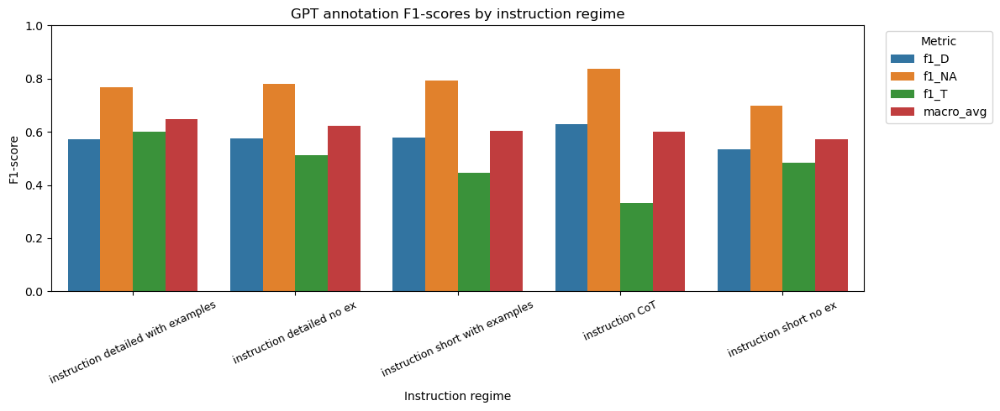

In [11]:
# visualisation for summary table
import matplotlib.pyplot as plt
import seaborn as sns

metric_cols = ["f1_D", "f1_NA", "f1_T", "macro_avg"]

plot_df = summary_df[metric_cols].copy()
plot_df.index = (
    plot_df.index
    .str.removeprefix("gpt_")
    .str.replace("_", " ", regex=False)
)

plot_long = plot_df.reset_index(names="regime").melt(
    id_vars="regime",
    var_name="metric",
    value_name="f1",
)

fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(data=plot_long, x="regime", y="f1", hue="metric", ax=ax)

ax.set_ylim(0, 1)
ax.set_ylabel("F1-score")
ax.set_xlabel("Instruction regime")
ax.set_title("GPT annotation F1-scores by instruction regime")
ax.tick_params(axis="x", rotation=25, labelsize=9)
ax.legend(title="Metric", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.savefig("Figure_Classification Report GPT4o_Different Instructions.png", dpi=300, bbox_inches="tight")
plt.show()
